In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# 월별 전체적인 변화량 확인

In [4]:
label_sum = pd.read_csv('../Data/Preprocessed_data/AirBnB_labels_dong.csv')
#label_mean = pd.read_csv('../Data/Preprocessed_data/AirBnB_labels_dong_mean.csv')

# 날짜형 변환
#label_mean['Reporting Month'] = pd.to_datetime(label_mean['Reporting Month'])
label_sum['Reporting Month'] = pd.to_datetime(label_sum['Reporting Month'])

# 우리 모델의 순서와 일치
label_sum = label_sum.sort_values(by=['Reporting Month', 'Dong_name']).reset_index(drop=True)
#label_mean = label_mean.sort_values(by=['Reporting Month', 'Dong_name']).reset_index(drop=True)

In [5]:
label_sum.describe()

,Reporting Month,Reservation Days,Revenue (USD),Number of Reservations
count,28408,28408.000000,2.840800e+04,28408.000000
mean,2019-10-01 08:57:18.805970176,354.981695,2.511656e+04,117.238278
min,2017-01-01 00:00:00,0.000000,0.000000e+00,0.000000
25%,2018-05-01 00:00:00,13.000000,5.190900e+02,3.000000
50%,2019-10-01 00:00:00,56.000000,2.644385e+03,16.000000
75%,2021-03-01 00:00:00,192.000000,1.018392e+04,61.000000
max,2022-07-01 00:00:00,54335.000000,5.754302e+06,17995.000000
std,NaN,1677.118460,1.323836e+05,541.639600


In [ ]:
#ex[ex['Reporting Month']=='2021-12'].head(15)
#ex[ex['Reporting Month']=='2021-11'].head(15)

In [6]:
# label_sum 데이터프레임이 이미 로드되었다고 가정
cols = ['Reservation Days', 'Revenue (USD)', 'Number of Reservations']

# 각 동별 평균과 표준편차 계산
stats = label_sum.groupby('Dong_name')[cols].agg(['mean', 'std'])

# 표준편차가 0인 경우 1로 변경하여 나눗셈 오류 방지
stats.loc[:, (slice(None), 'std')] = stats.loc[:, (slice(None), 'std')].replace(0, 1)

# 정규화된 데이터프레임 생성 (원본 유지)
dong_norm_label_sum = label_sum.copy()

# 각 동별 Z-score 정규화 수행
for col in cols:
    dong_norm_label_sum[col] = dong_norm_label_sum.apply(
        lambda row: (row[col] - stats.loc[row['Dong_name'], (col, 'mean')]) / stats.loc[row['Dong_name'], (col, 'std')], axis=1
    )

# 1. 동별 정규화 결과
dong_norm_label_sum

,Reporting Month,Dong_name,Reservation Days,Revenue (USD),Number of Reservations
0,2017-01-01,가락1동,-1.094569,-0.938107,-1.094646
1,2017-01-01,가락2동,-1.201413,-1.097208,-1.108685
2,2017-01-01,가락본동,-0.020646,0.039350,0.017501
3,2017-01-01,가리봉동,-0.761678,-0.608202,-0.467573
4,2017-01-01,가산동,-1.238290,-1.048447,-1.204577
...,...,...,...,...,...
28403,2022-07-01,효창동,-0.225165,0.349666,0.143053
28404,2022-07-01,후암동,0.121720,0.698818,0.163026
28405,2022-07-01,휘경1동,3.026162,2.706221,2.641801
28406,2022-07-01,휘경2동,1.118379,1.532243,1.188023


In [9]:
# 2. label 로그화 데이터
label_sum_log = label_sum.copy() 
log_cols = ['Reservation Days', 'Revenue (USD)', 'Number of Reservations']


for col in log_cols:
    label_sum_log[col] = np.log1p(label_sum_log[col])  # log(1 + x) 변환 적용
    
label_sum_log

,Reporting Month,Dong_name,Reservation Days,Revenue (USD),Number of Reservations
0,2017-01-01,가락1동,0.000000,0.000000,0.000000
1,2017-01-01,가락2동,0.000000,0.000000,0.000000
2,2017-01-01,가락본동,4.532599,8.371166,3.433987
3,2017-01-01,가리봉동,2.079442,6.246107,1.791759
4,2017-01-01,가산동,0.000000,0.000000,0.000000
...,...,...,...,...,...
28403,2022-07-01,효창동,4.912655,9.082164,3.806662
28404,2022-07-01,후암동,6.964136,11.637277,5.961005
28405,2022-07-01,휘경1동,6.194405,9.850622,5.043425
28406,2022-07-01,휘경2동,4.897840,8.419183,3.737670


In [8]:
label_sum_log.describe()

,Reporting Month,Reservation Days,Revenue (USD),Number of Reservations
count,28408,28408.000000,28408.000000,28408.000000
mean,2019-10-01 08:57:18.805970176,3.826734,7.155790,2.868148
min,2017-01-01 00:00:00,0.000000,0.000000,0.000000
25%,2018-05-01 00:00:00,2.639057,6.254002,1.386294
50%,2019-10-01 00:00:00,4.043051,7.880572,2.833213
75%,2021-03-01 00:00:00,5.262690,9.228663,4.127134
max,2022-07-01 00:00:00,10.902942,15.565459,9.797905
std,NaN,2.186761,3.392957,1.904469


In [10]:
# 3. sum 정규화 
from sklearn.preprocessing import StandardScaler

# 데이터 복사
df = label_sum.copy()

# 숫자형 열만 선택 (datetime 및 object 제외)
df_numeric = df.select_dtypes(include=['number'])

# StandardScaler 적용
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), columns=df_numeric.columns)

# 원본 데이터프레임에 정규화된 값 적용
label_sum_norm = df.copy()
label_sum_norm[df_numeric.columns] = df_scaled

label_sum_norm

,Reporting Month,Dong_name,Reservation Days,Revenue (USD),Number of Reservations
0,2017-01-01,가락1동,-0.211665,-0.189729,-0.216455
1,2017-01-01,가락2동,-0.211665,-0.189729,-0.216455
2,2017-01-01,가락본동,-0.156808,-0.157099,-0.161066
3,2017-01-01,가리봉동,-0.207491,-0.185839,-0.207223
4,2017-01-01,가산동,-0.211665,-0.189729,-0.216455
...,...,...,...,...,...
28403,2022-07-01,효창동,-0.131169,-0.123285,-0.135218
28404,2022-07-01,후암동,0.418593,0.665683,0.498055
28405,2022-07-01,휘경1동,0.079911,-0.046437,0.067872
28406,2022-07-01,휘경2동,-0.132361,-0.155493,-0.140757


In [11]:
# 4. sum log 변환 후 정규화

# 데이터 복사
df = label_sum_log.copy()

# 숫자형 열만 선택 (datetime 및 object 제외)
df_numeric = df.select_dtypes(include=['number'])

# StandardScaler 적용
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric), columns=df_numeric.columns)

# 원본 데이터프레임에 정규화된 값 적용
label_sum_log_norm = df.copy()
label_sum_log_norm[df_numeric.columns] = df_scaled

label_sum_log_norm

,Reporting Month,Dong_name,Reservation Days,Revenue (USD),Number of Reservations
0,2017-01-01,가락1동,-1.749987,-2.109050,-1.506036
1,2017-01-01,가락2동,-1.749987,-2.109050,-1.506036
2,2017-01-01,가락본동,0.322796,0.358212,0.297117
3,2017-01-01,가리봉동,-0.799047,-0.268114,-0.565201
4,2017-01-01,가산동,-1.749987,-2.109050,-1.506036
...,...,...,...,...,...
28403,2022-07-01,효창동,0.496597,0.567767,0.492805
28404,2022-07-01,후암동,1.434751,1.320844,1.624029
28405,2022-07-01,휘경1동,1.082749,0.794257,1.142216
28406,2022-07-01,휘경2동,0.489822,0.372364,0.456577


In [12]:
label_sum_log_norm.describe()

,Reporting Month,Reservation Days,Revenue (USD),Number of Reservations
count,28408,2.840800e+04,2.840800e+04,2.840800e+04
mean,2019-10-01 08:57:18.805970176,1.470709e-16,7.003378e-18,3.021457e-16
min,2017-01-01 00:00:00,-1.749987e+00,-2.109050e+00,-1.506036e+00
25%,2018-05-01 00:00:00,-5.431312e-01,-2.657870e-01,-7.781063e-01
50%,2019-10-01 00:00:00,9.892292e-02,2.136174e-01,-1.834363e-02
75%,2021-03-01 00:00:00,6.566705e-01,6.109449e-01,6.610814e-01
max,2022-07-01 00:00:00,3.235989e+00,2.478610e+00,3.638746e+00
std,NaN,1.000018e+00,1.000018e+00,1.000018e+00


In [13]:
display(label_sum.head())

,Reporting Month,Dong_name,Reservation Days,Revenue (USD),Number of Reservations
0,2017-01-01,가락1동,0.0,0.00,0.0
1,2017-01-01,가락2동,0.0,0.00,0.0
2,2017-01-01,가락본동,92.0,4319.67,30.0
3,2017-01-01,가리봉동,7.0,515.00,5.0
4,2017-01-01,가산동,0.0,0.00,0.0


In [14]:
# 전체 트렌드 확인
total_sum = label_sum.groupby('Reporting Month', as_index=False)[["Reservation Days", "Revenue (USD)", "Number of Reservations"]].mean()

In [15]:
# 각 label별 트렌드 확인
def trend_graph(df1, df2, col_name):
    
    fig, axes = plt.subplots(1, 2, figsize=(25, 6))
    
    # df1 그래프
    axes[0].plot(df1["Reporting Month"], df1[col_name], marker='o', label="df1", color='b')
    axes[0].set_xlabel("Reporting Month")
    axes[0].set_ylabel(col_name)
    axes[0].set_title(f"Monthly Trends of {col_name} (df_sum)")
    axes[0].legend()
    axes[0].tick_params(axis='x', rotation=45)

    # df2 그래프
    axes[1].plot(df2["Reporting Month"], df2[col_name], marker='o', label="df2", color='r')
    axes[1].set_xlabel("Reporting Month")
    axes[1].set_ylabel(col_name)
    axes[1].set_title(f"Monthly Trends of {col_name} (df_mean)")
    axes[1].legend()
    axes[1].tick_params(axis='x', rotation=45)

    fig.subplots_adjust(wspace=0.3)
    plt.tight_layout()  # 레이아웃 조정
    plt.show()


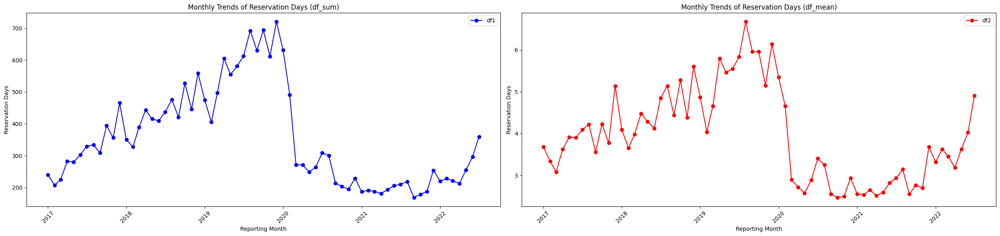

In [23]:
trend_graph(total_sum, total_mean, 'Reservation Days')

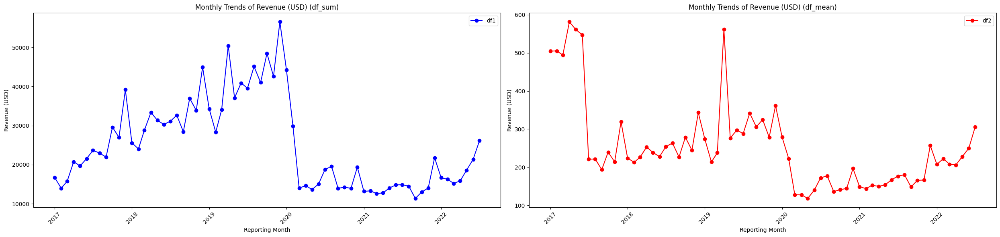

In [24]:
trend_graph(total_sum, total_mean, 'Revenue (USD)')

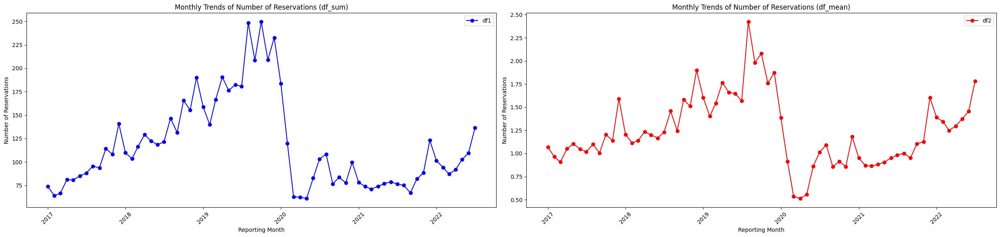

In [25]:
trend_graph(total_sum, total_mean, 'Number of Reservations')

# 동별 변화량 확인

In [27]:
from matplotlib import cm, pyplot as plt
import matplotlib.font_manager as fm

def plot_dong_time_series(df1, df2, y):
    plt.rc('font', family='NanumGothic')
    plt.rcParams['axes.unicode_minus'] = False
    
    fig, axes = plt.subplots(1, 2, figsize=(25, 6), sharex=True)
    
    # 25개의 색상을 생성하기 위해 컬러맵 설정
    colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성

    # 변수(y) 기준 상위 10개 동 선택
    top_10_dongs_df1 = df1.groupby('Dong_name')[y].sum().nlargest(10).index
    top_10_dongs_df2 = df2.groupby('Dong_name')[y].sum().nlargest(10).index
    
    # 첫 번째 데이터프레임 (df1)
    for idx, dong in enumerate(df1['Dong_name'].unique()):
        df_dong = df1[df1['Dong_name'] == dong]
        color = colors(idx % 25)

        # 상위 10개 동은 레전드 추가, 나머지는 투명도 적용
        if dong in top_10_dongs_df1:
            axes[0].plot(df_dong['Reporting Month'], df_dong[y], label=dong, marker='o', color=color)
        else:
            axes[0].plot(df_dong['Reporting Month'], df_dong[y], color=color, alpha=0.5)

    axes[0].set_title(f'{y} over time (df_sum)')
    axes[0].set_xlabel('Reporting Month')
    axes[0].set_ylabel(y)
    axes[0].grid(True)
    axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))

    # 두 번째 데이터프레임 (df2)
    for idx, dong in enumerate(df2['Dong_name'].unique()):
        df_dong = df2[df2['Dong_name'] == dong]
        color = colors(idx % 25)

        if dong in top_10_dongs_df2:
            axes[1].plot(df_dong['Reporting Month'], df_dong[y], label=dong, marker='o', color=color)
        else:
            axes[1].plot(df_dong['Reporting Month'], df_dong[y], color=color, alpha=0.5)

    axes[1].set_title(f'{y} over time (df_mean)')
    axes[1].set_xlabel('Reporting Month')
    axes[1].set_ylabel(y)
    axes[1].grid(True)
    axes[1].legend(loc='upper left', bbox_to_anchor=(1, 1))

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

In [34]:
#label_sum[label_sum['Dong_name']=='서교동']

/tmp/ipykernel_39902/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


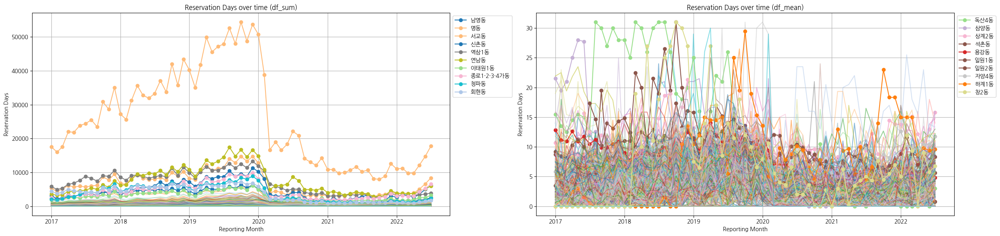

In [ ]:
# 합 vs 평균균
plot_dong_time_series(label_sum, label_mean, 'Reservation Days')

/tmp/ipykernel_85944/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


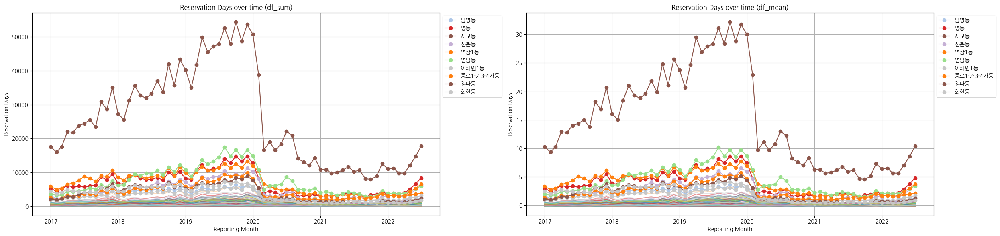

In [ ]:
# 합 vs 합 + 정규화
plot_dong_time_series(label_sum, label_sum_norm, 'Reservation Days')

/tmp/ipykernel_85944/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


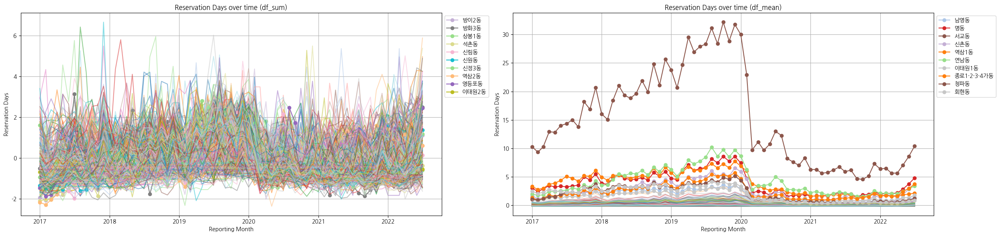

In [ ]:
# 동별 정규화 vs 합 정규화
plot_dong_time_series(dong_norm_label_sum, label_sum_norm, 'Reservation Days')

/tmp/ipykernel_85944/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


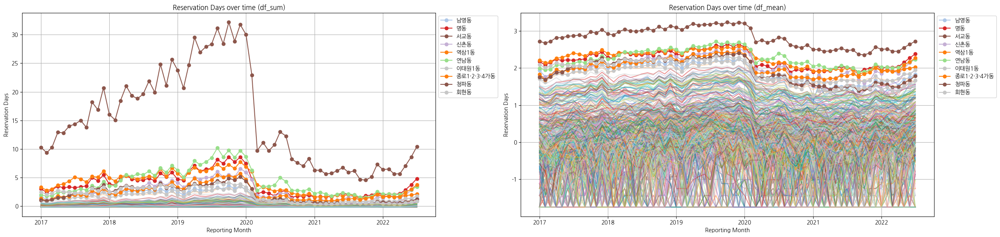

In [ ]:
# 정규화 vs log변환 + 정규화
plot_dong_time_series(label_sum_norm, label_sum_log_norm, 'Reservation Days')

/tmp/ipykernel_85944/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


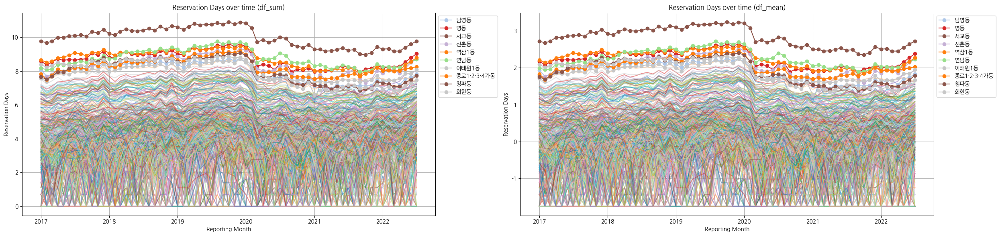

In [33]:
# log변환환 vs log변환 + 정규화
plot_dong_time_series(label_sum_log, label_sum_log_norm, 'Reservation Days')

/tmp/ipykernel_39902/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


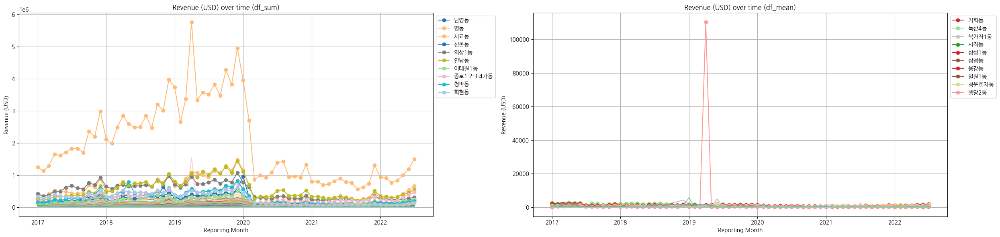

In [31]:
plot_dong_time_series(label_sum, label_mean, 'Revenue (USD)')

/tmp/ipykernel_39902/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


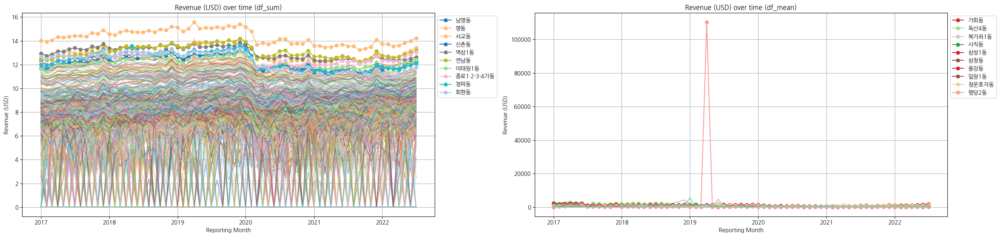

In [61]:
plot_dong_time_series(label_sum_log, label_mean, 'Revenue (USD)')

/tmp/ipykernel_39902/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


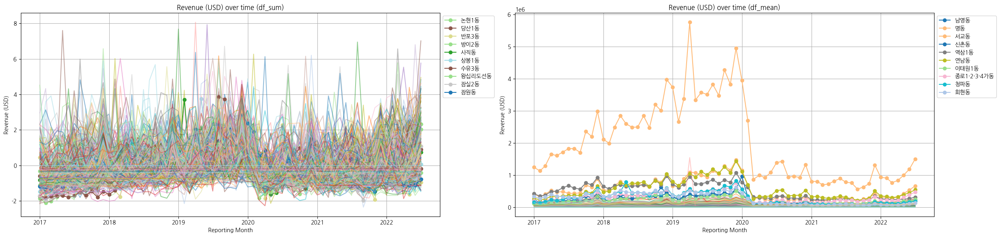

In [56]:
# 정규화 한 뒤의 결과 확인인
plot_dong_time_series(norm_label_sum, label_sum, 'Revenue (USD)')

/tmp/ipykernel_39902/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


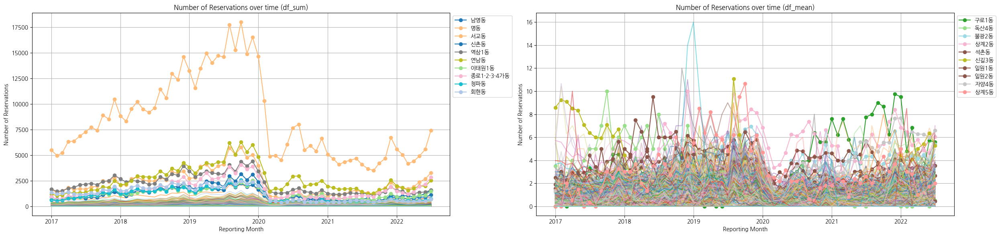

In [32]:
plot_dong_time_series(label_sum, label_mean, 'Number of Reservations')

/tmp/ipykernel_39902/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


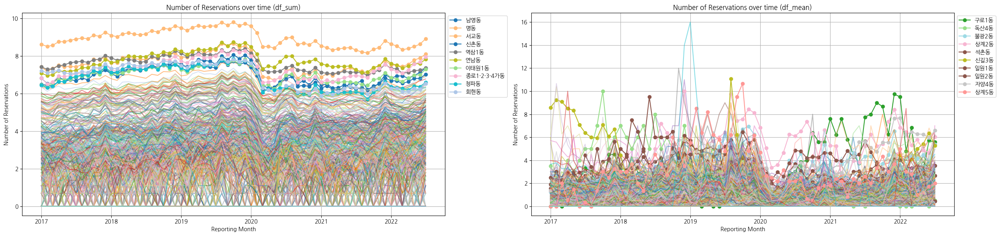

In [62]:
plot_dong_time_series(label_sum_log, label_mean, 'Number of Reservations')

/tmp/ipykernel_39902/3857452488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', 25)  # 25개의 색상 생성


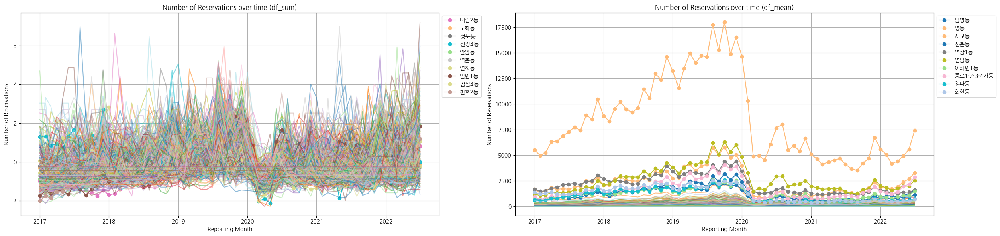

In [57]:
# 정규화 한 뒤의 결과 확인인
plot_dong_time_series(norm_label_sum, label_sum, 'Number of Reservations')

# 유동 인구 데이터 확인

In [ ]:
hf_df = pd.read_csv('../Data/Preprocessed_data/Dong/Human_flow.csv')
#hf_df.columns

In [30]:
hf_trend = hf_df.groupby('Reporting Month', as_index=False)[["Total Population", "Total Long-Term Foreigner Population", "Total Short-Term Foreigner Population"]].mean()
hf_trend

,Reporting Month,Total Population,Total Long-Term Foreigner Population,Total Short-Term Foreigner Population
0,2017-01-01,25720.088446,1000.114529,476.305433
1,2017-02-01,26207.023458,1000.177157,459.534104
2,2017-03-01,26185.087757,1011.406135,483.996915
3,2017-04-01,25798.634867,989.974730,491.255802
4,2017-05-01,25653.641679,958.362389,448.647038
...,...,...,...,...
62,2022-03-01,24434.694722,899.704239,236.995567
63,2022-04-01,24410.770083,899.630568,221.582859
64,2022-05-01,24749.387481,913.047563,260.286838
65,2022-06-01,24997.836778,921.046424,287.972095


/tmp/ipykernel_275840/889367609.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


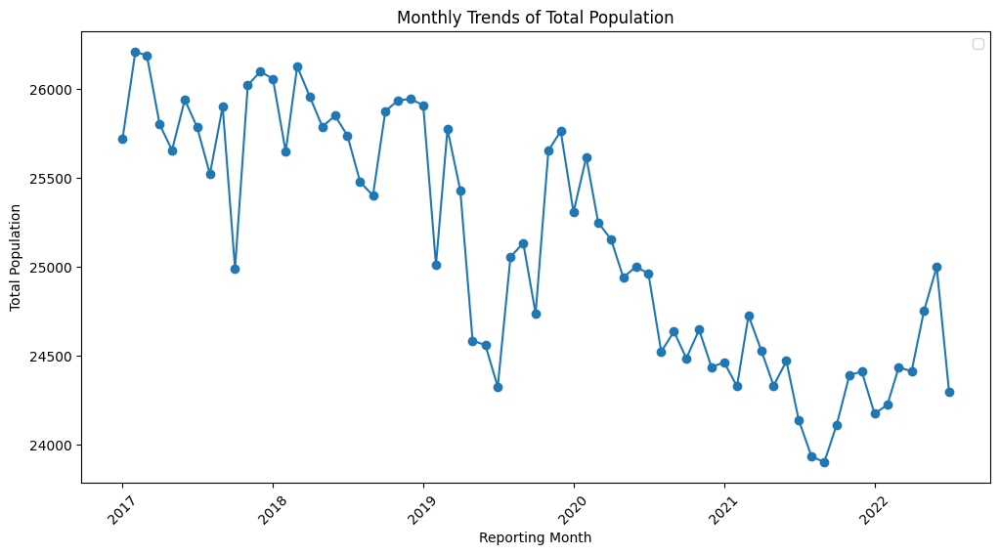

In [32]:
trend_graph(hf_trend, 'Total Population')

/tmp/ipykernel_275840/889367609.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


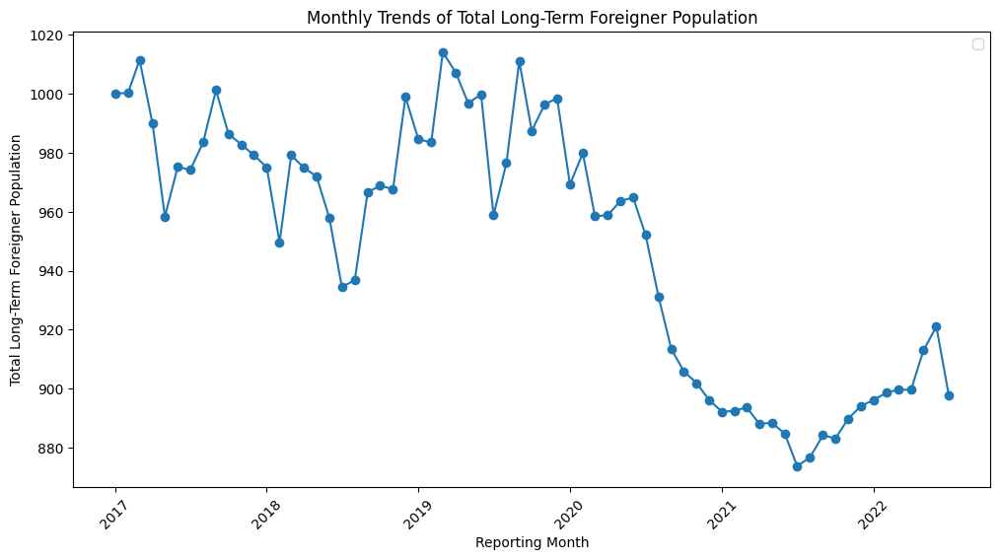

In [33]:
trend_graph(hf_trend, 'Total Long-Term Foreigner Population')

/tmp/ipykernel_275840/889367609.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


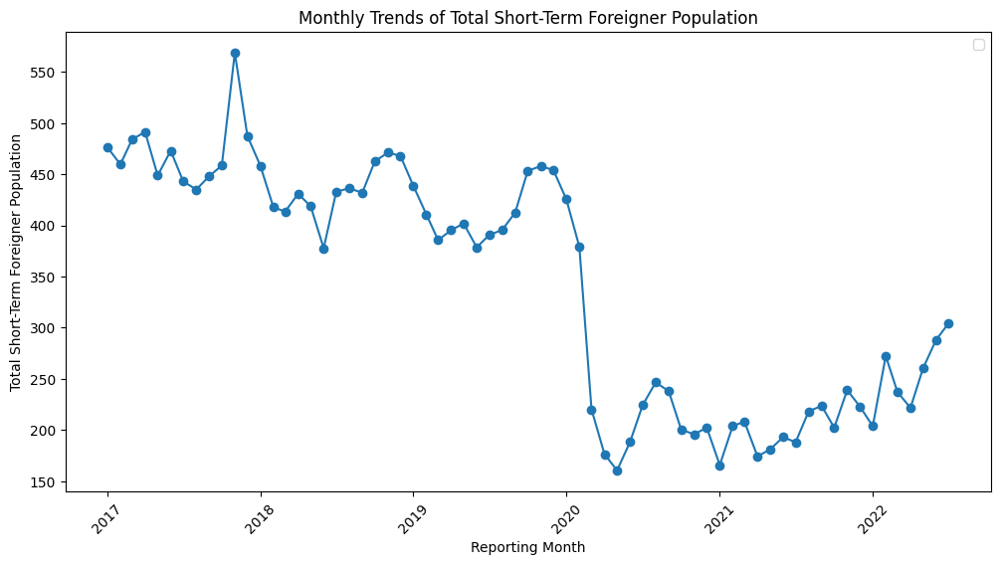

In [34]:
trend_graph(hf_trend, "Total Short-Term Foreigner Population")

In [35]:
airbnb_llm = ['Gemma_nolisting_raw', 'Gemma_nolisting_refined', 'Llama_mixed_raw', 'Llama_mixed_refined', 'Llama_nolisting_raw', 'Llama_nolisting_refined', 'Llama_only_listings']


In [36]:
for llm_name in airbnb_llm:
    ex_df = pd.read_csv(f'../Data/Preprocessed_data/Dong/llm_embeddings/AirBnB_{llm_name}.csv')
    print(ex_df.shape)

(28408, 2306)
(28408, 2306)
(28408, 3074)
(28408, 3074)
(28408, 3074)
(28408, 3074)
(28408, 3074)
